# ThymoSight (human)

<a id='contents'></a>

## Table of contents 

### 0 Notebook setup <a href='#setup'>🕹️</a>

### 1 Data reanalysis <a href='#reanalysis'>🕹️</a>

- **2020.02.21 - Park et al. <a href='#park-2020'>🕹️</a> [🔗](https://www.science.org/doi/10.1126/science.aay3224?url_ver=Z39.88-2003&rfr_id=ori:rid:crossref.org&rfr_dat=cr_pub%20%200pubmed) [⬇️](https://zenodo.org/records/3711134)**

- **2021.02.17 - Bautista et al. <a href='#bautista-2021'>🕹️</a> [🔗](https://www.nature.com/articles/s41467-021-21346-6) [⬇️](https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE147520)**

- **2023.08.30 - Ragazzini et al. <a href='#ragazzini-2023'>🕹️</a> [🔗](https://www.cell.com/developmental-cell/fulltext/S1534-5807(23)00413-6?_returnURL=https%3A%2F%2Flinkinghub.elsevier.com%2Fretrieve%2Fpii%2FS1534580723004136%3Fshowall%3Dtrue) [⬇️](https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE220830) [⬇️](https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE220206) [⬇️](https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE220829)** 




### 2 Data integration <a href='#integration'>🕹️</a>

*Note: Click on 🕹️ to move to the respective notebook section. Click on ⬇️ to download the public dataset. Click on 🔗 for publication link.*

<a id='setup'></a>

## 0 Notebook setup

In [ ]:
#import sys
#!{sys.executable} -m pip install wrapt

In [1]:
import warnings
warnings.filterwarnings('ignore')

import scanpy as sc
import scanpy.external as sce
import numpy as np
import pandas as pd
import matplotlib.font_manager
import matplotlib.lines as lines
import seaborn as sns
#import feather
import re
import os
import warnings, scipy.sparse as sp, matplotlib, matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.pyplot import rc_context
import matplotlib.lines as lines

from collections import Counter
from pathlib import Path
from scipy import sparse

#from scipy.sparse import csgraph

matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
matplotlib.rcParams['font.family'] = 'sans-serif'
matplotlib.rcParams['font.sans-serif'] = 'Arial'
matplotlib.rc('font', size=14)

sc.set_figure_params(dpi=80, dpi_save=300, color_map='Spectral_r', vector_friendly=True, transparent=True)
sc.settings.verbosity = 0 # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.n_jobs=10
sc.logging.print_header()

warnings.filterwarnings('ignore', category=UserWarning)
warnings.filterwarnings('ignore', category=FutureWarning)

pd.set_option('display.max_rows', 100)

scanpy==1.9.8 anndata==0.10.5.post1 umap==0.5.5 numpy==1.26.4 scipy==1.12.0 pandas==2.2.1 scikit-learn==1.4.1.post1 statsmodels==0.14.1 igraph==0.11.4 pynndescent==0.5.11


In [2]:
def observe_variance(anndata_object):
    fig = plt.figure(figsize=(10,5))
    ax1 = fig.add_subplot(121)
    ax2 = fig.add_subplot(122)
    # variance per principal component
    x = range(len(anndata_object.uns['pca']['variance_ratio']))
    y = anndata_object.uns['pca']['variance_ratio']
    ax1.scatter(x,y,s=4)
    ax1.set_xlabel('PC')
    ax1.set_ylabel('Fraction of variance explained\n')
    ax1.set_title('Fraction of variance explained per PC\n')
    # cumulative variance explained
    cml_var_explained = np.cumsum(anndata_object.uns['pca']['variance_ratio'])
    x = range(len(anndata_object.uns['pca']['variance_ratio']))
    y = cml_var_explained
    ax2.scatter(x,y,s=4)
    ax2.set_xlabel('PC')
    ax2.set_ylabel('Cumulative fraction of variance\nexplained')
    ax2.set_title('Cumulative fraction of variance\nexplained by PCs')
    fig.tight_layout()
    plot = plt.show
    return(plot)

In [3]:
#adapted from https://autobencoder.com/2021-10-03-gene-conversion/
    
import biomart

def get_ensembl_mappings():                                   
    # Set up connection to server                                               
    server = biomart.BiomartServer('http://useast.ensembl.org/biomart')         
    mart = server.datasets['mmusculus_gene_ensembl']                            
                                                                                
    # List the types of data we want                                            
    attributes = ['ensembl_transcript_id', 'mgi_symbol', 
                  'ensembl_gene_id', 'ensembl_peptide_id']
                                                                                
    # Get the mapping between the attributes                                    
    response = mart.search({'attributes': attributes})                          
    data = response.raw.data.decode('ascii')                                    
                                                                                
    ensembl_to_genesymbol = {}                                                  
    # Store the data in a dict                                                  
    for line in data.splitlines():                                              
        line = line.split('\t')                                                 
        # The entries are in the same order as in the `attributes` variable
        transcript_id = line[0]                                                 
        gene_symbol = line[1]                                                   
        ensembl_gene = line[2]                                                  
        ensembl_peptide = line[3]                                               
                                                                                
        # Some of these keys may be an empty string. If you want, you can 
        # avoid having a '' key in your dict by ensuring the 
        # transcript/gene/peptide ids have a nonzero length before
        # adding them to the dict
        ensembl_to_genesymbol[transcript_id] = gene_symbol                      
        ensembl_to_genesymbol[ensembl_gene] = gene_symbol                       
        ensembl_to_genesymbol[ensembl_peptide] = gene_symbol                
                                                                                
    return ensembl_to_genesymbol

In [4]:
# divergent
user_defined_palette =  [ '#3283FE', '#16FF32', '#F6222E',  '#FEAF16', '#BDCDFF', '#3B00FB', '#1CFFCE', '#C075A6', '#F8A19F', '#B5EFB5', '#FBE426', '#C4451C', '#2ED9FF', '#c1c119', '#8b0000', '#FE00FA', '#1CBE4F', '#1C8356', '#0e452b', '#AA0DFE', '#B5EFB5', '#325A9B', '#90AD1C']
# gradient of one color
user_defined_cmap_markers = LinearSegmentedColormap.from_list('mycmap', ["#E6E6FF", "#CCCCFF", "#B2B2FF", "#9999FF",  "#6666FF",   "#3333FF", "#0000FF"])
# gradient of two colors
user_defined_cmap_degs = LinearSegmentedColormap.from_list('mycmap', ["#0000FF", "#3333FF", "#6666FF", "#9999FF", "#B2B2FF", "#CCCCFF", "#E6E6FF", "#E6FFE6", "#CCFFCC", "#B2FFB2", "#99FF99", "#66FF66", "#33FF33", "#00FF00"])

In [5]:
%matplotlib inline 

### List of subset signatures from KousaJahnZhao et al., 2024

In [6]:

#EC subsets
artEC_sign = ['Fbln5',	'Stmn2',	'Clu',	'Sema3g',	'Glul',	'Tm4sf1',	'Eps8l2',	'Col8a1',	'Nebl',	'Vegfc',	'Alpl',	'Arl15',	'Gja4',	'Edn1',	'S100a6',	'Mast4',	'Sox17',	'Pdgfd',	'Fbln2',	'Vim']
capEC_sign = ['Gpihbp1',	'Rgcc',	'Fabp4',	'Cd36',	'Ca4',	'Mgll',	'Cd300lg',	'Tcf15',	'Kdr',	'Arhgap18',	'Igfbp7',	'Kank3',	'Aqp7',	'KIAA1217',	'Tspan13',	'Cavin2',	'Hspb1',	'Ppp1r2',	'Lims2',	'Fabp5']
venEC_sign = ['Lrg1',	'Il6st',	'Vwf',	'Plvap',	'mt-Co1',	'Selp',	'Spint2',	'Pcdh7',	'mt-Nd4',	'H2RSP',	'Tmsb10',	'Eef1a1',	'mt-Co3',	'Bgn',	'Pde4d',	'mt-Atp6',	'Aqp1',	'Tpt1',	'Ackr1']

#FB subsets
capsFB_sign = ['Pi16',	'Timp2',	'Fn1',	'Opcml',	'Cd248',	'Mfap5',	'Anxa3',	'Pcolce2',	'Ackr3',	'Fndc1',	'Igfbp6',	'Sema3c',	'Clec3b',	'Creb5',	'Smpd3',	'Tmem100',	'Adgrd1',	'Pcsk6',	'Nid1']
intFB_sign = ['Smoc2',	'Gpx3',	'Penk',	'Igf1',	'Gas1',	'Inmt',	'Pcolce',	'Lrp1',	'Itm2a',	'Gdf10',	'Rbp1',	'Fbln1',	'Sfrp1',	'Slit3',	'Svep1',	'Auts2',	'Lpl',	'Celf2',	'Serpinf1',	'Il11ra1']
medFB_sign = ['Csmd1',	'Serpine2',	'Enpp2',	'Ptn',	'Tmem176b',	'Tmem176a',	'B2m',	'Ccl19',	'Igfbp7',	'Apod',	'Bgn',	'Hla-a', 'Des',	'Ltc4s',	'Lhfp',	'Ifitm1',	'Cd9',	'Apoe',	'Lsamp',	'Ly6e']

<a id='reanalysis'></a>

# Data re-analysis

<a id='park-2020'></a>

## Park et al. 2020

In [ ]:
path_to_h5ad = '../data/public/[2020.02.21] Park et al./HTA07.A01.v02.entire_data_raw_count.h5ad'

In [ ]:
park_adata = sc.read_h5ad(path_to_h5ad)

In [ ]:
park_metadata = pd.read_csv('../data/public/[2020.02.21] Park et al./HTA08.v01.A05.Science_human_fig1.csv', sep=',')

In [ ]:
park_metadata.index = park_metadata['index']

In [ ]:
park_adata = park_adata[park_metadata.index]

In [ ]:
park_adata.obs = park_metadata

In [ ]:
park_adata.var_names_make_unique()

In [ ]:
park_adata = park_adata[(park_adata.obs['Anno_level_fig1']=='Endo') | (park_adata.obs['Anno_level_fig1']=='Fb_1') | (park_adata.obs['Anno_level_fig1']=='Fb_2') |
(park_adata.obs['Anno_level_fig1']=='Fb_cycling') | (park_adata.obs['Anno_level_fig1']=='TEC(myo') | (park_adata.obs['Anno_level_fig1']=='TEC(neuro') |
(park_adata.obs['Anno_level_fig1']=='VSMC') | (park_adata.obs['Anno_level_fig1']=='cTEC') | (park_adata.obs['Anno_level_fig1']=='mTEC(I)') |
(park_adata.obs['Anno_level_fig1']=='mTEC(II)') | (park_adata.obs['Anno_level_fig1']=='mTEC(III)') | (park_adata.obs['Anno_level_fig1']=='mTEC(IV)') |
(park_adata.obs['Anno_level_fig1']=='mcTEC')]

In [ ]:
park_adata.obs['sample'] = park_adata.obs['Sample']

In [ ]:
park_adata.raw = park_adata # keep a copy of the raw adata 
np.random.seed(42) 
index_list = np.arange(park_adata.shape[0]) # randomize the order of cells for plotting
np.random.shuffle(index_list)
park_adata = park_adata[index_list]

In [ ]:
sc.pp.calculate_qc_metrics(park_adata, inplace=True)

#store unfiltered/unprocessed data into new fields prior to downstream analysis
park_adata.obs['original_total_counts'] = park_adata.obs['total_counts']
park_adata.obs['log10_original_total_counts'] = np.log10(park_adata.obs['original_total_counts'])

# select mitochondrial, ribosomal and hemoglobin genes (case sensitive)
park_adata.var['mt'] = park_adata.var_names.str.startswith(('MT-', 'mt-'))
park_adata.var['ribo'] = park_adata.var_names.str.startswith(('RPS','RPL', 'Rps', 'Rpl'))
park_adata.var['hb'] = park_adata.var_names.str.startswith(('HB', 'Hb'))

# for each cell compute fraction of counts in mitochondrial, ribosomal and hemoglobin genes vs. all genes 
park_adata.obs['mito_frac'] = np.sum(park_adata[:,park_adata.var['mt']==True].X, axis=1) / np.sum(park_adata.X, axis=1)
park_adata.obs['ribo_frac'] = np.sum(park_adata[:,park_adata.var['ribo']==True].X, axis=1) / np.sum(park_adata.X, axis=1)
park_adata.obs['hb_frac'] = np.sum(park_adata[:,park_adata.var['hb']==True].X, axis=1) / np.sum(park_adata.X, axis=1)

In [ ]:
sc.pl.violin(park_adata, ['n_genes_by_counts', 'log10_original_total_counts', 'ribo_frac', 'mito_frac', 'hb_frac'],  
             palette=user_defined_palette, groupby='Sample',  jitter=0.4, rotation= 90)

In [ ]:
sc.external.pp.scrublet(park_adata, threshold=0.085, random_state=42) # run scrublet to predict potential doublets

In [ ]:
sc.external.pl.scrublet_score_distribution(park_adata) # inspect automatic threshold

In [ ]:
sc.pp.filter_genes(park_adata, min_cells=1) # remove columns with all 0s

In [ ]:
park_adata = park_adata[:,park_adata.var['ribo']==False]
park_adata.shape # check number of genes after ribosomal gene removal

In [ ]:
park_adata = park_adata[:,park_adata.var['hb']==False]
park_adata.shape # check number of genes after hemoglobin gene removal

In [ ]:
sc.pp.normalize_per_cell(park_adata, counts_per_cell_after=10**4)

In [ ]:
sc.pp.log1p(park_adata)

In [ ]:
rng = np.random.RandomState(42) # set seed 
sc.tl.pca(park_adata, n_comps=200, svd_solver='arpack', random_state=rng)

In [ ]:
observe_variance(park_adata)

In [ ]:
rng = np.random.RandomState(42) # set seed 
sc.tl.pca(park_adata, n_comps=15,  svd_solver='arpack', random_state=rng)
sc.pp.neighbors(park_adata, n_neighbors=15, random_state=42) # set seed
sc.tl.umap(park_adata)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    park_adata, 
    color=['log10_original_total_counts', 'n_genes_by_counts','ribo_frac', 'mito_frac'],
    palette=user_defined_palette,  
    ncols=5,
    size=10,
    use_raw=False,
    outline_width=[0.6, 0.05],
    frameon=False,
    cmap='Spectral_r',
    wspace = 0.5,
    add_outline=True
)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
   park_adata, 
    color=['Anno_level_fig1', 'MPZ', 'PTPRC', 'EPCAM', 'PDGFRA', 'PECAM1', 'PLET1', 'ACTA2', 'NKAIN4', 'S100B'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    size=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = True,
    vmax=2
)

In [ ]:
park_adata_memo = park_adata

In [ ]:
sc.pl.umap(
    park_adata, 
    color=['doublet_score'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=5,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
park_adata = park_adata[park_adata.obs['predicted_doublet'] == False] # remove cells annotated as doublets

In [ ]:
sc.pl.umap(
    park_adata, 
    color=['doublet_score'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=5,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
park_adata.shape

In [ ]:
park_adata.obs['keep_cell'] = '0.yes'
keep_cells = pd.concat([park_adata.obs['keep_cell']])
park_adata_memo.obs['keep_cell'] = '1.no'

In [ ]:
park_adata_memo.obs['keep_cell'][park_adata_memo.obs.index.isin(keep_cells.index) == True] = '0.yes'

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    park_adata_memo, 
    color=['keep_cell'], 
    palette=['blue',  '#d3d3d3'],  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=5,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
crosstb = pd.crosstab(park_adata_memo.obs['Sample'], park_adata_memo.obs['keep_cell'])

In [ ]:
with rc_context({'figure.figsize': (17, 3)}):
    ax = crosstb.plot(kind="bar", stacked=True, edgecolor = "black", width=0.8,  color=['blue', '#d3d3d3'])
    ax.grid(False) 
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    # to save plot unhash the line bellow
    #plt.savefig('barplot_keepcells_S1.pdf')

In [ ]:
sc.pl.violin(park_adata, ['n_genes_by_counts', 'log10_original_total_counts', 'ribo_frac', 'mito_frac', 'hb_frac'],  
             palette=user_defined_palette,  jitter=0.4, groupby = 'Sample', rotation= 90)

In [ ]:
sc.pp.highly_variable_genes(park_adata, n_top_genes=2000, n_bins=20, flavor='seurat',  inplace=True)

In [ ]:
rng = np.random.RandomState(42)
sc.tl.pca(park_adata, n_comps=55, svd_solver='arpack', random_state=rng, use_highly_variable=True)

In [ ]:
sce.pp.harmony_integrate(park_adata, 'sample')

In [ ]:
sc.pp.neighbors(park_adata, n_neighbors=15, use_rep='X_pca_harmony',  random_state=rng)

In [ ]:
sc.tl.umap(park_adata)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    park_adata, 
    color=['EPCAM',  'TRPM3', 'HLA-DPA1', 'PDGFRA', 'PECAM1', 'ACTA2', 'NKAIN4', 'S100B', 'Anno_level_fig1'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    size=20,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
park_adata.obs['tissue'] = 'thymus'

In [ ]:
park_adata.obs['sample'] = park_adata.obs['donor']

In [ ]:
park_adata.obs['sorted_cell'] = ['whole tissue' if 'TOT' in x else 'CD45+' if '45P' in x else 
                                 'CD45- (MACS-enriched)' if '45NM' in x else 'CD45- (FACS-isolated)' if '45N' in x else 
                                 'Epcam+' if 'EPCAM' in x else 'error' for x in park_adata.obs['sort'] ]

In [ ]:
park_adata.obs['age'] = park_adata.obs['Age']

In [ ]:
park_adata.obs['tissue'] = ['thymus' if x=='TH' else 'error' for x in park_adata.obs['organ'] ]

In [ ]:
park_adata.obs['gender'] = ['female' if x=='Female' else 'male' for x in park_adata.obs['Gender'] ]

In [ ]:
park_adata.obs['age_range'] = ['adult' if (x=='24y' or x=='35y') else 'pediatric' for x in park_adata.obs['Age'] ]

In [ ]:
park_adata.obs['treatment'] = 'none' 

In [ ]:
park_adata.obs['cell_type_subset'] = park_adata.obs['Anno_level_fig1']

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    park_adata, 
    color=['sample', 'tissue', 'sorted_cell', 'age_range', 'age', 'cell_type_subset',  'gender',  'treatment'],
    palette=user_defined_palette,  
    ncols=4,
    use_raw=False,
    outline_width=[0.6, 0.05],
    frameon=False,
    cmap='Spectral_r',
    wspace = 0.5,
    add_outline=True
)

In [ ]:
park_adata.obs = park_adata.obs.loc[:,['sample', 'tissue', 'sorted_cell', 'cell_type_subset', 'age_range', 'age', 'gender','treatment']]

In [ ]:
park_adata.uns['neighbors']['params']['random_state'] = str('RandomState(MT19937) at 0x284569F40')

In [ ]:
path_to_h5ad = '../../../APPS/thymosight/data/human/park_et_al_2020.h5ad'

In [ ]:
park_adata.write(path_to_h5ad)

In [ ]:
park_adata = sc.read_h5ad(path_to_h5ad)

Return to the beginning of this notebook <a href='#contents'>here</a>.

<a id='park-2021'></a>

## Bautista et al. 2021

In [ ]:
bautista_list=[]

tenexdir = '../data/public/[2021.02.17] bautista et al./GSE147520_RAW/'

h5_path = Path(tenexdir).glob('GSM*')

for path in h5_path:
    tmp_adata = sc.read_10x_mtx(path = path,  var_names = "gene_symbols", cache = False)
    tmp_adata.var_names_make_unique()
    bautista_list.append(tmp_adata)

In [ ]:
bautista_adata = sc.concat(
    bautista_list, # add more annadata objects here separated by commas
    join='outer', 
    label = 'sample',
    keys = ['F_19wks',	'F_23wks_1', 'P_6d', 'P_10m_1', 'F_23wks_2', 'P_10m_2', 'A_25y'], # or use your sample_names list (as used above) here. 
    # Make sure the order of the batch categories matches that of the AnnData objects 
    index_unique = '-')

In [ ]:
#pd.DataFrame((bautista_meta.obs.index.str.extract(r'-(.*)'))[0]=='1-3-Peds-0').value_counts()

In [ ]:
bautista_adata.raw = bautista_adata # keep a copy of the raw adata 
np.random.seed(42)
index_list = np.arange(bautista_adata.shape[0]) # randomize the order of cells for plotting
np.random.shuffle(index_list)
bautista_adata = bautista_adata[index_list]

In [ ]:
sc.pp.calculate_qc_metrics(bautista_adata, inplace=True)

#store unfiltered/unprocessed data into new fields prior to downstream analysis
bautista_adata.obs['original_total_counts'] = bautista_adata.obs['total_counts']
bautista_adata.obs['log10_original_total_counts'] = np.log10(bautista_adata.obs['original_total_counts'])

# select mitochondrial, ribosomal and hemoglobin genes (case sensitive)
bautista_adata.var['mt'] = bautista_adata.var_names.str.startswith(('MT-', 'mt-'))
bautista_adata.var['ribo'] = bautista_adata.var_names.str.startswith(('RPS','RPL', 'Rps', 'Rpl'))
bautista_adata.var['hb'] = bautista_adata.var_names.str.startswith(('HB', 'Hb'))

# for each cell compute fraction of counts in mitochondrial, ribosomal and hemoglobin genes vs. all genes 
bautista_adata.obs['mito_frac'] = np.sum(bautista_adata[:,bautista_adata.var['mt']==True].X, axis=1) / np.sum(bautista_adata.X, axis=1)
bautista_adata.obs['ribo_frac'] = np.sum(bautista_adata[:,bautista_adata.var['ribo']==True].X, axis=1) / np.sum(bautista_adata.X, axis=1)
bautista_adata.obs['hb_frac'] = np.sum(bautista_adata[:,bautista_adata.var['hb']==True].X, axis=1) / np.sum(bautista_adata.X, axis=1)

In [ ]:
sc.pl.violin(bautista_adata, ['n_genes_by_counts', 'log10_original_total_counts', 'ribo_frac', 'mito_frac', 'hb_frac'],  
             palette=user_defined_palette,  jitter=0.4, groupby = 'sample', rotation= 90)

In [ ]:
sc.external.pp.scrublet(bautista_adata, threshold=0.145, random_state=42) # run scrublet to predict potential doublets

In [ ]:
sc.external.pl.scrublet_score_distribution(bautista_adata) # inspect automatic threshold

In [ ]:
sc.pp.filter_genes(bautista_adata, min_cells=1) # remove columns with all 0s

In [ ]:
bautista_adata = bautista_adata[:,bautista_adata.var['ribo']==False]
bautista_adata.shape # check number of genes after ribosomal gene removal

In [ ]:
bautista_adata = bautista_adata[:,bautista_adata.var['hb']==False]
bautista_adata.shape # check number of genes after hemoglobin gene removal

In [ ]:
sc.pp.normalize_per_cell(bautista_adata, counts_per_cell_after=10**4)

In [ ]:
sc.pp.log1p(bautista_adata)

In [ ]:
rng = np.random.RandomState(42) # set seed 
sc.tl.pca(bautista_adata, n_comps=200, svd_solver='arpack', random_state=rng)

In [ ]:
observe_variance(bautista_adata)

In [ ]:
rng = np.random.RandomState(42) # set seed 
sc.tl.pca(bautista_adata, n_comps=10,  svd_solver='arpack', random_state=rng)
sc.pp.neighbors(bautista_adata, n_neighbors=15, random_state=rng) # set seed
sc.tl.umap(bautista_adata)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    bautista_adata, 
    color=['log10_original_total_counts', 'n_genes_by_counts','ribo_frac', 'mito_frac'],
    palette=user_defined_palette,  
    ncols=5,
    size=15,
    use_raw=False,
    outline_width=[0.6, 0.05],
    frameon=False,
    cmap='Spectral_r',
    wspace = 0.5,
    add_outline=True
)

In [ ]:
for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    sc.tl.leiden(bautista_adata, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
   bautista_adata, 
    color=['leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 
           'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    size=15,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
bautista_adata_memo = bautista_adata

In [ ]:
clusters_to_remove = ['24', '34', '38', '39']
cluster_filter = [x not in clusters_to_remove for x in bautista_adata.obs['leiden_1.0']]
print('Total number of cells pre-filtering: ' + str(bautista_adata.shape[0]))
print('Number of cells to keep after filtering: ' + str(sum(cluster_filter)))
bautista_adata_filtered = bautista_adata[cluster_filter]

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    bautista_adata_filtered, 
    color=['leiden_1.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    bautista_adata_filtered, 
    color=['log10_original_total_counts', 'n_genes_by_counts','ribo_frac', 'mito_frac'],
    palette=user_defined_palette,  
    ncols=5,
    size=15,
    use_raw=False,
    outline_width=[0.6, 0.05],
    frameon=False,
    cmap='Spectral_r',
    wspace = 0.5,
    add_outline=True
)

In [ ]:
bautista_adata = bautista_adata_filtered

In [ ]:
sc.pl.umap(
    bautista_adata, 
    color=['doublet_score'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
bautista_adata = bautista_adata[bautista_adata.obs['predicted_doublet'] == False] # remove cells annotated as doublets

In [ ]:
sc.pl.umap(
    bautista_adata, 
    color=['doublet_score'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
bautista_adata.shape

In [ ]:
bautista_adata.obs['keep_cell'] = '0.yes'
keep_cells = pd.concat([bautista_adata.obs['keep_cell']])
bautista_adata_memo.obs['keep_cell'] = '1.no'

In [ ]:
bautista_adata_memo.obs['keep_cell'][bautista_adata_memo.obs.index.isin(keep_cells.index) == True] = '0.yes'

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    bautista_adata_memo, 
    color=['keep_cell'], 
    palette=['blue',  '#d3d3d3'],  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
crosstb = pd.crosstab(bautista_adata_memo.obs['sample'], bautista_adata_memo.obs['keep_cell'])

In [ ]:
with rc_context({'figure.figsize': (2, 3)}):
    ax = crosstb.plot(kind="bar", stacked=True, edgecolor = "black", width=0.8,  color=['blue', '#d3d3d3'])
    ax.grid(False) 
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    # to save plot unhash the line bellow
    #plt.savefig('barplot_keepcells_S1.pdf')

In [ ]:
sc.pl.violin(bautista_adata, ['n_genes_by_counts', 'log10_original_total_counts', 'ribo_frac', 'mito_frac', 'hb_frac'],  
             palette=user_defined_palette,  jitter=0.4, groupby = 'sample', rotation= 90)

In [ ]:
sc.pp.highly_variable_genes(bautista_adata, n_top_genes=2000, n_bins=20, flavor='seurat',  inplace=True)

In [ ]:
rng = np.random.RandomState(42)
sc.tl.pca(bautista_adata, n_comps=65, svd_solver='arpack', random_state=rng, use_highly_variable=True)

In [ ]:
sce.pp.harmony_integrate(bautista_adata, 'sample')

In [ ]:
sc.pp.neighbors(bautista_adata, n_neighbors=15, use_rep='X_pca_harmony',  random_state=rng)

In [ ]:
sc.tl.umap(bautista_adata)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    bautista_adata, 
    color=['EPCAM',  'TRPM3', 'HLA-DPA1', 'PDGFRA', 'PECAM1', 'ACTA2', 'NKAIN4', 'S100B', 'sample'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    size=20,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    sc.tl.leiden(bautista_adata, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
   bautista_adata, 
    color=['leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 
           'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    size=15,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
   bautista_adata, 
    color=['EPCAM', 'PTPRC', 'PECAM1', 'PDGFRA'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    size=15,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
bautista_adata.obs['cell_type_subset'] = ['TEC' if (x=='7' or x=='3' or x=='4') else
                                               'other' for x in bautista_adata.obs['leiden_0.2'] ]

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
   bautista_adata, 
    color=['cell_type_subset', 'sample'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    size=15,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
bautista_adata.obs['tissue'] = 'thymus'

In [ ]:
bautista_adata.obs['age'] = ['19w' if (x=='F_19wks') else '23w' if (x=='F_23wks_1' or x=='F_23wks_2') else '25y' if x=='A_25y' else
                             'P6' if x=='P_6d' else '10m' if (x=='P_10m_1' or x=='P_10m_2') else 'error'   for x in bautista_adata.obs['sample'] ]

In [ ]:
bautista_adata.obs['age_range'] = ['adult' if (x=='A_25y') else 'pediatric' for x in bautista_adata.obs['sample'] ]

In [ ]:
bautista_adata.obs['sorted_cell'] = 'CD45- Epcam- | Epcam+ | CD45+'

In [ ]:
bautista_adata.obs['gender'] = 'na' 

In [ ]:
bautista_adata.obs['treatment'] = 'none' 

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    bautista_adata, 
    color=['sample', 'tissue', 'sorted_cell', 'age_range', 'age', 'cell_type_subset',  'gender',  'treatment'],
    palette=user_defined_palette,  
    ncols=4,
    use_raw=False,
    outline_width=[0.6, 0.05],
    frameon=False,
    cmap='Spectral_r',
    wspace = 0.5,
    add_outline=True
)

In [ ]:
bautista_adata.obs = bautista_adata.obs.loc[:,['sample', 'tissue', 'sorted_cell', 'age_range', 'age', 'cell_type_subset',  'gender',  'treatment']]

In [ ]:
bautista_adata.uns['neighbors']['params']['random_state'] = str('RandomState(MT19937) at 0x115F68D40')

In [ ]:
path_to_h5ad = '../../../APPS/thymosight/data/human/bautista_et_al_2021.h5ad'

In [ ]:
bautista_adata.write(path_to_h5ad)

In [ ]:
bautista_adata = sc.read_h5ad(path_to_h5ad)

Return to the beginning of this notebook <a href='#contents'>here</a>.

<a id='ragazzini-2023'></a>

## Ragazzini et al. 2023

In [ ]:
ragazzini_list=[]

tenexdir = '../data/public/[2023.08.30] Ragazzini et al./GSE220830_RAW/'

h5_path = Path(tenexdir).glob('GSM*')

for path in h5_path:
    tmp_adata = sc.read_10x_mtx(path = path,  var_names = "gene_symbols", cache = False)
    tmp_adata.var_names_make_unique()
    ragazzini_list.append(tmp_adata)

In [ ]:
ragazzini_adata = sc.concat(
    ragazzini_list, # add more annadata objects here separated by commas
    join='outer', 
    label = 'sample',
    keys = ['mTEC_CD49fpos',	'cTEC_CD49fpos', 'cTEC', 'mTEC'], # or use your sample_names list (as used above) here. 
    # Make sure the order of the batch categories matches that of the AnnData objects 
    index_unique = '@')

In [ ]:
ragazzini_adata.raw = ragazzini_adata # keep a copy of the raw adata 
np.random.seed(42) 
index_list = np.arange(ragazzini_adata.shape[0]) # randomize the order of cells for plotting
np.random.shuffle(index_list)
ragazzini_adata = ragazzini_adata[index_list]

In [ ]:
sc.pp.calculate_qc_metrics(ragazzini_adata, inplace=True)

#store unfiltered/unprocessed data into new fields prior to downstream analysis
ragazzini_adata.obs['original_total_counts'] = ragazzini_adata.obs['total_counts']
ragazzini_adata.obs['log10_original_total_counts'] = np.log10(ragazzini_adata.obs['original_total_counts'])

# select mitochondrial, ribosomal and hemoglobin genes (case sensitive)
ragazzini_adata.var['mt'] = ragazzini_adata.var_names.str.startswith(('MT-', 'mt-'))
ragazzini_adata.var['ribo'] = ragazzini_adata.var_names.str.startswith(('RPS','RPL', 'Rps', 'Rpl'))
ragazzini_adata.var['hb'] = ragazzini_adata.var_names.str.startswith(('HB', 'Hb'))

# for each cell compute fraction of counts in mitochondrial, ribosomal and hemoglobin genes vs. all genes 
ragazzini_adata.obs['mito_frac'] = np.sum(ragazzini_adata[:,ragazzini_adata.var['mt']==True].X, axis=1) / np.sum(ragazzini_adata.X, axis=1)
ragazzini_adata.obs['ribo_frac'] = np.sum(ragazzini_adata[:,ragazzini_adata.var['ribo']==True].X, axis=1) / np.sum(ragazzini_adata.X, axis=1)
ragazzini_adata.obs['hb_frac'] = np.sum(ragazzini_adata[:,ragazzini_adata.var['hb']==True].X, axis=1) / np.sum(ragazzini_adata.X, axis=1)

In [ ]:
sc.pl.violin(ragazzini_adata, ['n_genes_by_counts', 'log10_original_total_counts', 'ribo_frac', 'mito_frac', 'hb_frac'],  
             palette=user_defined_palette,  jitter=0.4, groupby = 'sample', rotation= 90)

In [ ]:
sc.external.pp.scrublet(ragazzini_adata, threshold=0.105, random_state=42) # run scrublet to predict potential doublets

In [ ]:
sc.external.pl.scrublet_score_distribution(ragazzini_adata) # inspect automatic threshold

In [ ]:
sc.pp.filter_genes(ragazzini_adata, min_cells=1) # remove columns with all 0s

In [ ]:
ragazzini_adata = ragazzini_adata[:,ragazzini_adata.var['ribo']==False]
ragazzini_adata.shape # check number of genes after ribosomal gene removal

In [ ]:
ragazzini_adata = ragazzini_adata[:,ragazzini_adata.var['hb']==False]
ragazzini_adata.shape # check number of genes after hemoglobin gene removal

In [ ]:
sc.pp.normalize_per_cell(ragazzini_adata, counts_per_cell_after=10**4)

In [ ]:
sc.pp.log1p(ragazzini_adata)

In [ ]:
rng = np.random.RandomState(42) # set seed 
sc.tl.pca(ragazzini_adata, n_comps=200, svd_solver='arpack', random_state=rng)

In [ ]:
observe_variance(ragazzini_adata)

In [ ]:
rng = np.random.RandomState(42) # set seed 
sc.tl.pca(ragazzini_adata, n_comps=10,  svd_solver='arpack', random_state=rng)
sc.pp.neighbors(ragazzini_adata, n_neighbors=15, random_state=rng) # set seed
sc.tl.umap(ragazzini_adata)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    ragazzini_adata, 
    color=['log10_original_total_counts', 'n_genes_by_counts','ribo_frac', 'mito_frac'],
    palette=user_defined_palette,  
    ncols=5,
    size=15,
    use_raw=False,
    outline_width=[0.6, 0.05],
    frameon=False,
    cmap='Spectral_r',
    wspace = 0.5,
    add_outline=True
)

In [ ]:
for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    sc.tl.leiden(ragazzini_adata, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
   ragazzini_adata, 
    color=['leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 
           'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    size=15,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
   ragazzini_adata, 
    color=['sample', 'EPCAM', 'PDGFRA', 'PECAM1', 'PLET1', 'ACTA2', 'NKAIN4', 'S100B'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    size=20,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
ragazzini_adata_memo = ragazzini_adata

In [ ]:
clusters_to_remove = ['3']
cluster_filter = [x not in clusters_to_remove for x in ragazzini_adata.obs['leiden_0.1']]
print('Total number of cells pre-filtering: ' + str(ragazzini_adata.shape[0]))
print('Number of cells to keep after filtering: ' + str(sum(cluster_filter)))
ragazzini_adata_filtered = ragazzini_adata[cluster_filter]

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    ragazzini_adata_filtered, 
    color=['leiden_0.1'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
ragazzini_adata = ragazzini_adata_filtered

In [ ]:
sc.pl.umap(
    ragazzini_adata, 
    color=['doublet_score'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
ragazzini_adata = ragazzini_adata[ragazzini_adata.obs['predicted_doublet'] == False] # remove cells annotated as doublets

In [ ]:
sc.pl.umap(
    ragazzini_adata, 
    color=['doublet_score'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
ragazzini_adata.shape

In [ ]:
ragazzini_adata.obs['keep_cell'] = '0.yes'
keep_cells = pd.concat([ragazzini_adata.obs['keep_cell']])
ragazzini_adata_memo.obs['keep_cell'] = '1.no'

In [ ]:
ragazzini_adata_memo.obs['keep_cell'][ragazzini_adata_memo.obs.index.isin(keep_cells.index) == True] = '0.yes'

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    ragazzini_adata_memo, 
    color=['keep_cell'], 
    palette=['blue',  '#d3d3d3'],  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
crosstb = pd.crosstab(ragazzini_adata_memo.obs['sample'], ragazzini_adata_memo.obs['keep_cell'])

In [ ]:
with rc_context({'figure.figsize': (2, 3)}):
    ax = crosstb.plot(kind="bar", stacked=True, edgecolor = "black", width=0.8,  color=['blue', '#d3d3d3'])
    ax.grid(False) 
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    # to save plot unhash the line bellow
    #plt.savefig('barplot_keepcells_S1.pdf')

In [ ]:
sc.pl.violin(ragazzini_adata, ['n_genes_by_counts', 'log10_original_total_counts', 'ribo_frac', 'mito_frac', 'hb_frac'],  
             palette=user_defined_palette,  jitter=0.4, groupby = 'sample', rotation= 90)

In [ ]:
ragazzini_adata.obs['tissue'] = 'thymus'

In [ ]:
ragazzini_adata.obs['sorted_cell'] = ['EpcamLow CD205+ CD49+' if x=='cTEC_CD49fpos' else 'EpcamHigh CD205- CD49f+' if x=='mTEC_CD49fpos' else 
                                      'EpcamLow CD205+' if x=='cTEC' else 'EpcamHigh CD205- CD49f+' if x=='mTEC' else 
                                      'error' for x in ragazzini_adata.obs['sample']]
ragazzini_adata.obs['cell_type_subset'] = 'TEC'

In [ ]:
ragazzini_adata.obs['age'] = 'na'
ragazzini_adata.obs['age_range'] = 'pediatric'
ragazzini_adata.obs['gender'] = 'female'
ragazzini_adata.obs['treatment'] = 'none'

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    ragazzini_adata, 
    color=['sample', 'tissue', 'sorted_cell', 'age_range', 'age', 'cell_type_subset',  'gender',  'treatment'], 
    palette=user_defined_palette,
    color_map='Spectral_r', 
    use_raw=False,
    ncols=4,
    wspace = 0.5,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
ragazzini_adata.obs = ragazzini_adata.obs.loc[:,['sample', 'tissue', 'sorted_cell', 'age_range', 'age', 'cell_type_subset',  'gender',  'treatment']]

In [ ]:
ragazzini_adata.uns['neighbors']['params']['random_state'] = str('RandomState(MT19937) at 0x17D9FF540')

In [ ]:
path_to_h5ad = '../../../APPS/thymosight/data/human/ragazzini_et_al_2023.h5ad'

In [ ]:
ragazzini_adata.write(path_to_h5ad)

In [ ]:
ragazzini_adata = sc.read_h5ad(path_to_h5ad)

Return to the beginning of this notebook <a href='#contents'>here</a>.

<a id='integration'></a>

## Concat public data and ours

In [7]:
path_to_h5ad = '../../../APPS/thymosight/data/human/park_et_al_2020.h5ad'

In [8]:
park_adata = sc.read_h5ad(path_to_h5ad)

In [9]:
path_to_h5ad = '../../../APPS/thymosight/data/human/bautista_et_al_2021.h5ad'

In [10]:
bautista_adata = sc.read_h5ad(path_to_h5ad)

In [11]:
path_to_h5ad = '../../../APPS/thymosight/data/human/ragazzini_et_al_2023.h5ad'

In [12]:
ragazzini_adata = sc.read_h5ad(path_to_h5ad)

In [13]:
# add tissue
thymus_stroma_human_TOTAL = sc.concat(
    [park_adata, bautista_adata, ragazzini_adata], # add more annadata objects here separated by commas
    join='outer', 
    label = 'entry',
    keys = ['park', 'bautista', 'ragazzini'], # or use your sample_names list (as used above) here. 
    # Make sure the order of the batch categories matches that of the AnnData objects 
    index_unique = '@'
)

In [14]:
thymus_stroma_human_TOTAL.raw = thymus_stroma_human_TOTAL # keep a copy of the raw adata 
np.random.seed(42)
index_list = np.arange(thymus_stroma_human_TOTAL.shape[0]) # randomize the order of cells for plotting
np.random.shuffle(index_list)
thymus_stroma_human_TOTAL = thymus_stroma_human_TOTAL[index_list]

In [15]:
thymus_stroma_human_TOTAL.shape

(115536, 38619)

In [16]:
x=19
sc.tl.score_genes(thymus_stroma_human_TOTAL, gene_list = map(lambda x: x.upper(), capsFB_sign[0:x]),  score_name='capsFB_sign', use_raw=False)
sc.tl.score_genes(thymus_stroma_human_TOTAL, gene_list = map(lambda x: x.upper(), intFB_sign[0:x]),  score_name='intFB_sign', use_raw=False)
sc.tl.score_genes(thymus_stroma_human_TOTAL, gene_list = map(lambda x: x.upper(), medFB_sign[0:x]),  score_name='medFB_sign', use_raw=False)
sc.tl.score_genes(thymus_stroma_human_TOTAL, gene_list = map(lambda x: x.upper(), artEC_sign[0:x]),  score_name='artEC_sign', use_raw=False)
sc.tl.score_genes(thymus_stroma_human_TOTAL, gene_list = map(lambda x: x.upper(), capEC_sign[0:x]),  score_name='capEC_sign', use_raw=False)
sc.tl.score_genes(thymus_stroma_human_TOTAL, gene_list = map(lambda x: x.upper(), venEC_sign[0:x]),  score_name='venEC_sign', use_raw=False)

In [17]:
#thymus_stroma_human_TOTAL = #thymus_stroma_human_TOTAL[(thymus_stroma_human_TOTAL.obs['cell_type_subset']=='TEC') & (thymus_stroma_human_TOTAL.obs['entry']!='ragazzini')]

In [18]:
sc.pp.filter_genes(thymus_stroma_human_TOTAL, min_cells=20) # remove columns with all 0s

In [19]:
for hvgs in [3000]:
    sc.pp.highly_variable_genes(thymus_stroma_human_TOTAL, n_top_genes=hvgs, n_bins=20, flavor='seurat',  inplace=True)
    rng = np.random.RandomState(42)
    for n_comps in [20]:
        sc.tl.pca(thymus_stroma_human_TOTAL, n_comps=n_comps, svd_solver='arpack', random_state=rng, use_highly_variable=True)
        sce.pp.harmony_integrate(thymus_stroma_human_TOTAL, 'sample')
        sc.pp.neighbors(thymus_stroma_human_TOTAL, n_neighbors=15, use_rep='X_pca_harmony',  random_state=rng)
        sc.tl.umap(thymus_stroma_human_TOTAL, min_dist=0.25)

2024-04-22 20:42:52,056 - harmonypy - INFO - Iteration 1 of 10
2024-04-22 20:43:15,709 - harmonypy - INFO - Iteration 2 of 10
2024-04-22 20:43:38,400 - harmonypy - INFO - Iteration 3 of 10
2024-04-22 20:44:03,207 - harmonypy - INFO - Iteration 4 of 10
2024-04-22 20:44:31,082 - harmonypy - INFO - Iteration 5 of 10
2024-04-22 20:44:54,702 - harmonypy - INFO - Iteration 6 of 10
2024-04-22 20:45:17,318 - harmonypy - INFO - Iteration 7 of 10
2024-04-22 20:45:39,808 - harmonypy - INFO - Iteration 8 of 10
2024-04-22 20:46:02,704 - harmonypy - INFO - Converged after 8 iterations


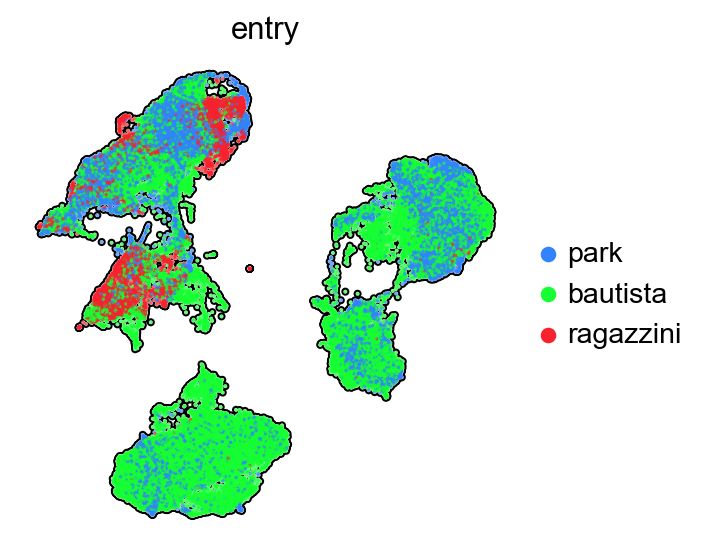

In [20]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)
sc.pl.umap(
    thymus_stroma_human_TOTAL, 
    color=['entry', ], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    size=10,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [ ]:
thymus_stroma_human_TOTAL.obs = thymus_stroma_human_TOTAL.obs.loc[:,['sample', 'tissue', 'age_range', 'age', 'gender', 'sorted_cell', 'treatment', 'cell_type_subset', 'dataset']]

In [21]:
thymus_stroma_human_TOTAL.uns['neighbors']['params']['random_state'] = str('RandomState(MT19937) at 0x285814140')

In [22]:
thymus_stroma_human_TOTAL.shape

(115536, 27286)

In [23]:
path_to_h5ad = '../../../APPS/thymosight/data/human/thymosight_cd45neg_TOTAL_human.h5ad'

In [24]:
thymus_stroma_human_TOTAL.write(path_to_h5ad)

### Human TEC

In [25]:
thymus_stroma_human_TOTAL_TEC = thymus_stroma_human_TOTAL[(thymus_stroma_human_TOTAL.obs['cell_type_subset']=='TEC') | 
                                                          (thymus_stroma_human_TOTAL.obs['cell_type_subset']=='cTEC') | 
                                                          (thymus_stroma_human_TOTAL.obs['cell_type_subset']=='mTEC(I)') |
                                                          (thymus_stroma_human_TOTAL.obs['cell_type_subset']=='mTEC(II)') |
                                                          (thymus_stroma_human_TOTAL.obs['cell_type_subset']=='mTEC(III)') |
                                                          (thymus_stroma_human_TOTAL.obs['cell_type_subset']=='mTEC(IV)') |
                                                          (thymus_stroma_human_TOTAL.obs['cell_type_subset']=='mcTEC')]

In [26]:
# Remove columns with all 0s
sc.pp.filter_genes(thymus_stroma_human_TOTAL_TEC, min_cells=1)

In [27]:
thymus_stroma_human_TOTAL_TEC.shape

(40144, 27270)

In [28]:
sc.pp.highly_variable_genes(thymus_stroma_human_TOTAL_TEC, n_top_genes=3500, n_bins=20, flavor='seurat')

In [29]:
rng = np.random.RandomState(42)
sc.tl.pca(thymus_stroma_human_TOTAL_TEC, n_comps=40, svd_solver='arpack', random_state=rng, use_highly_variable=True)

In [30]:
sce.pp.harmony_integrate(thymus_stroma_human_TOTAL_TEC, 'sample')

2024-04-22 20:49:59,424 - harmonypy - INFO - Iteration 1 of 10
2024-04-22 20:50:06,129 - harmonypy - INFO - Iteration 2 of 10
2024-04-22 20:50:12,595 - harmonypy - INFO - Iteration 3 of 10
2024-04-22 20:50:19,208 - harmonypy - INFO - Iteration 4 of 10
2024-04-22 20:50:25,917 - harmonypy - INFO - Iteration 5 of 10
2024-04-22 20:50:32,991 - harmonypy - INFO - Iteration 6 of 10
2024-04-22 20:50:39,364 - harmonypy - INFO - Iteration 7 of 10
2024-04-22 20:50:46,051 - harmonypy - INFO - Iteration 8 of 10
2024-04-22 20:50:52,561 - harmonypy - INFO - Converged after 8 iterations


In [31]:
sc.pp.neighbors(thymus_stroma_human_TOTAL_TEC, n_neighbors=15, use_rep='X_pca_harmony',  random_state=rng)

In [32]:
sc.tl.umap(thymus_stroma_human_TOTAL_TEC)

In [33]:
for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    sc.tl.leiden(thymus_stroma_human_TOTAL_TEC, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

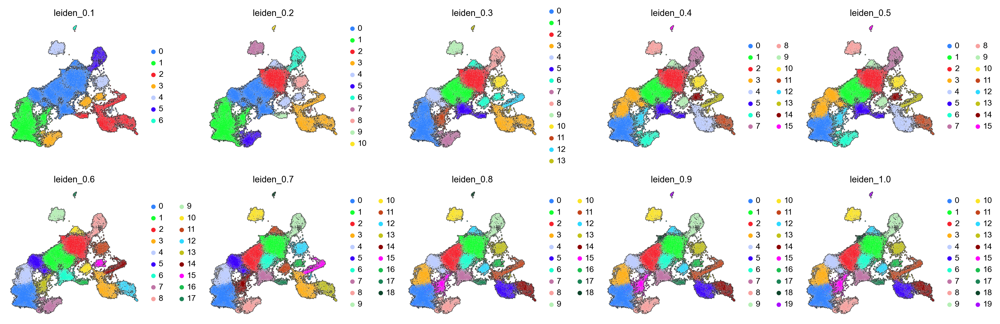

In [34]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    thymus_stroma_human_TOTAL_TEC, 
    color=['leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 
           'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [35]:
thymus_stroma_human_TOTAL_TEC_clean = thymus_stroma_human_TOTAL_TEC[(thymus_stroma_human_TOTAL_TEC.obs['leiden_0.4']!='10') &
                                                                    (thymus_stroma_human_TOTAL_TEC.obs['leiden_0.4']!='14') &
                                                                    (thymus_stroma_human_TOTAL_TEC.obs['leiden_0.4']!='15')]

In [36]:
# Remove columns with all 0s
sc.pp.filter_genes(thymus_stroma_human_TOTAL_TEC_clean, min_cells=1)

In [37]:
thymus_stroma_human_TOTAL_TEC_clean.shape

(38295, 27261)

In [38]:
sc.pp.highly_variable_genes(thymus_stroma_human_TOTAL_TEC_clean, n_top_genes=3500, n_bins=20, flavor='seurat')

In [39]:
rng = np.random.RandomState(42)
sc.tl.pca(thymus_stroma_human_TOTAL_TEC_clean, n_comps=30, svd_solver='arpack', random_state=rng, use_highly_variable=True)

In [40]:
sce.pp.harmony_integrate(thymus_stroma_human_TOTAL_TEC_clean, 'sample')

2024-04-22 20:51:45,657 - harmonypy - INFO - Iteration 1 of 10
2024-04-22 20:51:52,035 - harmonypy - INFO - Iteration 2 of 10
2024-04-22 20:51:58,934 - harmonypy - INFO - Iteration 3 of 10
2024-04-22 20:52:05,115 - harmonypy - INFO - Iteration 4 of 10
2024-04-22 20:52:11,551 - harmonypy - INFO - Iteration 5 of 10
2024-04-22 20:52:17,525 - harmonypy - INFO - Iteration 6 of 10
2024-04-22 20:52:24,104 - harmonypy - INFO - Iteration 7 of 10
2024-04-22 20:52:29,535 - harmonypy - INFO - Iteration 8 of 10
2024-04-22 20:52:36,251 - harmonypy - INFO - Converged after 8 iterations


In [41]:
sc.pp.neighbors(thymus_stroma_human_TOTAL_TEC_clean, n_neighbors=15, use_rep='X_pca_harmony',  random_state=rng)
sc.tl.umap(thymus_stroma_human_TOTAL_TEC_clean)

In [42]:
for resolution_parameter in [1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9, 2.0]:
    sc.tl.leiden(thymus_stroma_human_TOTAL_TEC_clean, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

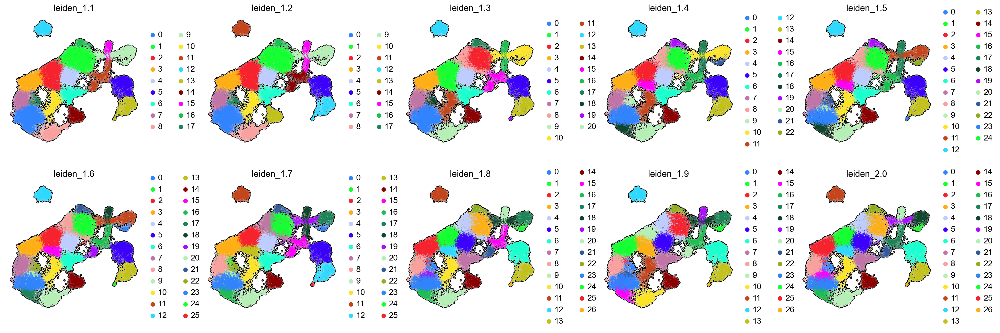

In [43]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    thymus_stroma_human_TOTAL_TEC_clean, 
    color=['leiden_1.1', 'leiden_1.2', 'leiden_1.3', 'leiden_1.4', 'leiden_1.5', 
           'leiden_1.6', 'leiden_1.7', 'leiden_1.8', 'leiden_1.9', 'leiden_2.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    size=10,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [44]:
#TEC subsets
aaTEC1_sign = ['Zbtb20',	'Cd81',	'Trpm3',	'Gstm1',	'Slc16a11',	'Btg1',	'Cldn3',	'Gsta4',	'S100a11',	'Ly6e',	'Cdk19',	'Slc9a3r1',	'Ifi27',	'Aldoc', 'Phlda1',	'Fam107a',	'Gsn',	'Anxa2']
aaTEC2_sign = ['Csmd1',	'Zeb2',	'Mgp',	'Gsn',	'Zbtb20',	'Ndrg2',	'Serpine2',	'Cd81',	'Fxyd1',	'Laptm4a',	'Gpx3',	'Socs3',	'Igfbp7',	'Airn',	'Lgals1',	'Fos',	'Prrx1',	'Prkg1',	'Sparc',	'Junb']
cTEC_sign = ['Ctsl',	'Cstb',	'Cxcl12',	'Prss16',	'Krt18',	'Gas6',	'Pltp',	'Slc46a2',	'Ndufa11',	'Tbata',	'Ccl25',	'Psmb11',	'Tmem131l',	'Nlgn1',	'Fam213b',	'Pax1',	'Wnt4',	'Dpp6',	'Psmb9',	'Bnip3l']
early_Pr = ['Apoe',	'Itm2b',	'Dcn',	'Gas6',	'Gas1',	'Rbms3',	'Laptm4a',	'Ctsl',	'Cpne8',	'Mir100hg',	'Gas5',	'Cst3',	'Ifitm3',	'Kazald1',	'Mir99ahg',	'Ifitm2',	'Plpp3',	'Oat',	'Auts2']
mTEC1_sign = ['Ccl21',	'Krt14',	'Krt5',	'Ifitm3',	'Apoe',	'Tpm2',	'Cald1',	'Ifi27',	'Ifitm2',	'Krt17',	'Nxn',	'Ctsl',	'Eya4',	'Rbms3',	'Perp',	'Igfbp4', 'Map1lc3a',	'Ank3']
mTECprol_sign = ['H2afz',	'Stmn1',	'Ran',	'Eif5a',	'Hmgb2',	'Ube2s',	'Ybx1',	'Phgdh',	'Ptma',	'Selenoh',	'Ppia',	'Tubb',	'Nme1',	'Pfn1',	'Ranbp1',	'Hmgn2',	'Hnrnpa1',	'Rbm3',	'Cks1b',	'Banf1']
mTEC2_sign = ['Srgn',	'Ubd',	'Cd52',	'Cyba',	'Cd74',	'HLA-DQA1',	'Syt1',	'Csn2',	'HLA-DRB1',	'S100a14',	'HLA-DOA',	'HLA-DRB1',	'Hdc',	'Mrpl38',	'Nfkbia',	'Aire',	'Nup85',	'Hagh',	'Calcb']
basal_sign = ['Ly6d',	'Dmkn',	'Spink5',	'Fxyd3', 'Dapl1',	'Hspb1',	'Sfn',	'Tacstd2',	'Pdzk1ip1',	'Prdx5', 'Fam3d', 'Cdkn2a',	'Perp',	'Cdkn1a',	'Cdkn2b',	'Gsta4',	'Atox1',	'Lypd3',	'Cst6']
tuft_sign = ['Mctp1',	'Gng13',	'Avil',	'Rgs13',	'Espn',	'Lrmp',	'Anxa4',	'Ltc4s',	'Ptpn18',	'Bmx',	'Cystm1',	'Ivns1abp',	'Fyb',	'Ly6g6f',	'Calm2',	'Ethe1',	'Reep5',	'Lima1',	'Pou2af2',	'Abhd2']
nTEC_sign = ['Ptprn2',	'Cacna2d1',	'Ca8',	'Scg5',	'Stxbp5l',	'Snap25',	'Chga',	'Cd9',	'Dnajc12',	'Ccser1',	'Pam',	'Camk2n1',	'Syt7',	'Cacna1a',	'Syt1',	'Cacnb2',	'Cystm1',	'Fam183b',	'Cplx2',	'Ceacam10']
goblet_sign = ['Wfdc2',	'Cyp2f1',	'Cxcl17',	'Gsto1',	'S100a11',	'Nupr1',	'Sorbs2',	'Anxa3',	'HLA-A',	'Krt19',	'Fxyd3',	'Ly6d',	'Ly6e',	'Serpinb11',	'Slc12a2',	'Anxa1', 'Bace2',	'Aqp5',	'Atp1b1']
Mlike_sign  = ['Ccl20',	'Ccl15', 'Ccl23', 'Serpinb6',	'Serpinb1',	'Tmsb4x',	'2200002D01Rik',	'Nostrin',	'Ctsh',	'Spib',	'Bcl2a1',	'Csn2',	'H2RSP',	'Fabp1',	'Hamp',	'Pold1',	'Atox1',	'Iscu']

In [45]:
x=19
sc.tl.score_genes(thymus_stroma_human_TOTAL_TEC_clean, gene_list = map(lambda x: x.upper(), aaTEC1_sign[0:x]),  score_name='aaTEC1_sign', use_raw=False)
sc.tl.score_genes(thymus_stroma_human_TOTAL_TEC_clean, gene_list = map(lambda x: x.upper(), aaTEC2_sign[0:x]),  score_name='aaTEC2_sign', use_raw=False)
sc.tl.score_genes(thymus_stroma_human_TOTAL_TEC_clean, gene_list = map(lambda x: x.upper(), cTEC_sign[0:x]),  score_name='cTEC_sign', use_raw=False)
sc.tl.score_genes(thymus_stroma_human_TOTAL_TEC_clean, gene_list = map(lambda x: x.upper(), early_Pr[0:x]),  score_name='early_Pr', use_raw=False)
sc.tl.score_genes(thymus_stroma_human_TOTAL_TEC_clean, gene_list = map(lambda x: x.upper(), mTEC1_sign[0:x]),  score_name='mTEC1_sign', use_raw=False)
sc.tl.score_genes(thymus_stroma_human_TOTAL_TEC_clean, gene_list = map(lambda x: x.upper(), mTECprol_sign[0:x]),  score_name='mTECprol_sign', use_raw=False)
sc.tl.score_genes(thymus_stroma_human_TOTAL_TEC_clean, gene_list = map(lambda x: x.upper(), mTEC2_sign[0:x]),  score_name='mTEC2_sign', use_raw=False)
sc.tl.score_genes(thymus_stroma_human_TOTAL_TEC_clean, gene_list = map(lambda x: x.upper(), basal_sign[0:x]),  score_name='basal_sign', use_raw=False)
sc.tl.score_genes(thymus_stroma_human_TOTAL_TEC_clean, gene_list = map(lambda x: x.upper(), tuft_sign[0:x]),  score_name='tuft_sign', use_raw=False)
sc.tl.score_genes(thymus_stroma_human_TOTAL_TEC_clean, gene_list = map(lambda x: x.upper(), nTEC_sign[0:x]),  score_name='nTEC_sign', use_raw=False)
sc.tl.score_genes(thymus_stroma_human_TOTAL_TEC_clean, gene_list = map(lambda x: x.upper(), goblet_sign[0:x]),  score_name='goblet_sign', use_raw=False)
sc.tl.score_genes(thymus_stroma_human_TOTAL_TEC_clean, gene_list = map(lambda x: x.upper(), Mlike_sign[0:x]),  score_name='Mlike_sign', use_raw=False)

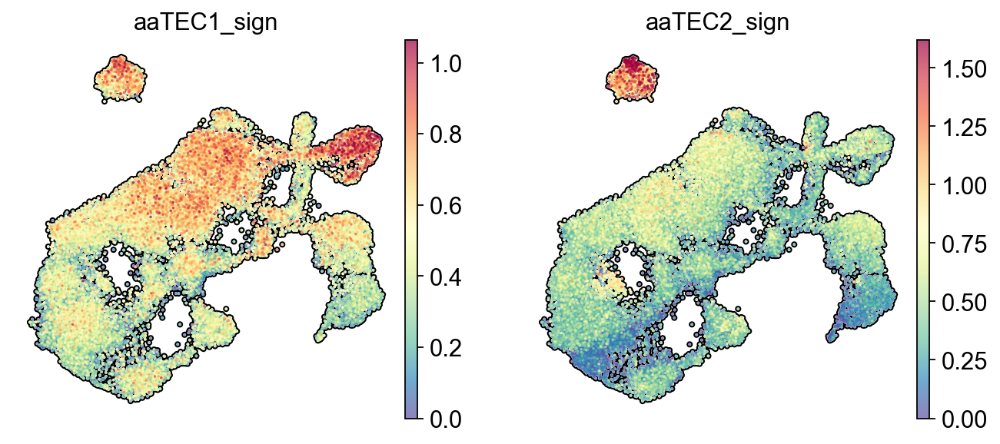

In [46]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    thymus_stroma_human_TOTAL_TEC_clean,
    color=['aaTEC1_sign', 'aaTEC2_sign'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=6,
    size=10,
    wspace = 0.2,
    outline_width=[0.6, 0.05],
    frameon=False, 
    add_outline=True,
    sort_order = True,
    vmin=0,
    vmax='p99.75'
)

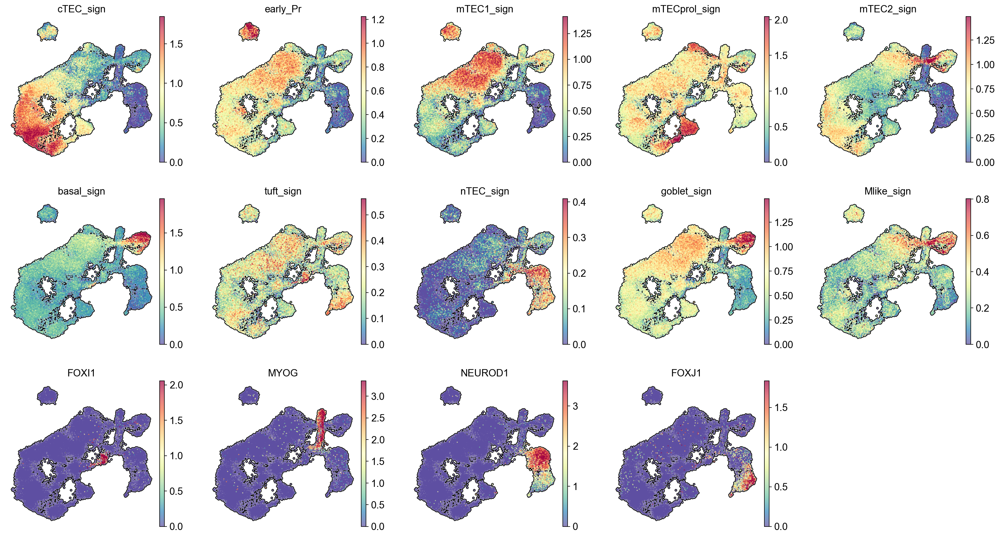

In [47]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    thymus_stroma_human_TOTAL_TEC_clean,
    color=['cTEC_sign', 'early_Pr', 'mTEC1_sign', 'mTECprol_sign', 'mTEC2_sign', 
          'basal_sign', 'tuft_sign', 'nTEC_sign', 'goblet_sign','Mlike_sign',  'FOXI1', 'MYOG', 'NEUROD1', 'FOXJ1'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    size=10,
    wspace = 0.2,
    outline_width=[0.6, 0.05],
    frameon=False, 
    add_outline=True,
    sort_order = True,
    vmin=0,
    vmax='p99.75'
)

In [55]:
thymus_stroma_human_TOTAL_TEC_clean.obs['cell_type_subset'] = ['TEC:cTEC' if ( x=='0' or x=='2' or x=='4' or x=='10' or x=='13' or x=='15'  or x=='23' or x=='26') else  
                                                               'TEC:mTEC1' if (x=='1' or x=='3' or x=='5' or x=='7' or x=='8' or x=='9') else
                                                               'TEC:mTEC-prol' if (x=='11' or x=='24') else 'TEC:mTEC2' if (x=='18' or x=='21') else 'TEC:mimetic(muscle)' if x=='17' else
                                                                'TEC:mimetic(basal-goblet-aaTEC1)' if (x=='16' ) else 'TEC:aaTEC2-earlyPr' if x=='12' else
                                                               'TEC:neuroendo' if x=='6' else
                                                                'error' for x in thymus_stroma_human_TOTAL_TEC_clean.obs['leiden_1.9']
                                                              ]

In [58]:
thymus_stroma_human_TOTAL_TEC_clean.obs['dataset'] = ['Park et al. (2020)' if x=='park' else 'Bautista et al. (2021)' if x=='bautista' else 
                                                      'Ragazzini et al. (2023)' if x=='ragazzini' else 
                                                      'ERROR' for x in thymus_stroma_human_TOTAL_TEC_clean.obs['entry']]

In [60]:
thymus_stroma_human_TOTAL_TEC_clean.uns['age_range_colors'] = ['#C4451C', '#76D6FF']
thymus_stroma_human_TOTAL_TEC_clean.uns['dataset_colors'] = user_defined_palette

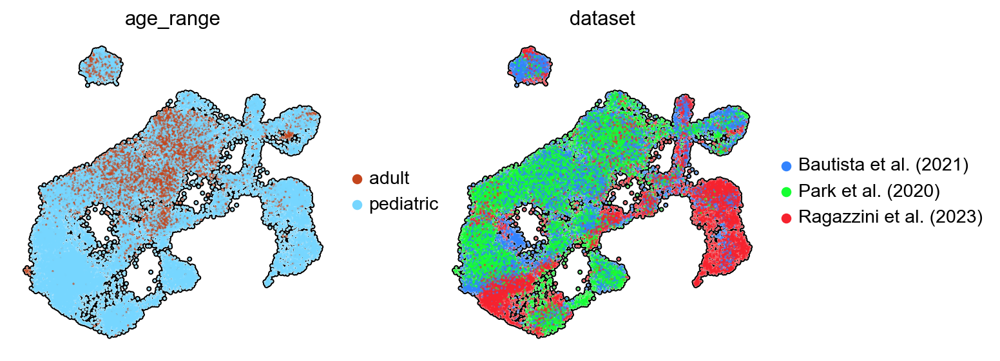

In [61]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    thymus_stroma_human_TOTAL_TEC_clean,
    color=['age_range', 'dataset'],
    color_map='Spectral_r', 
    use_raw=False,
    ncols=6,
    size=10,
    wspace = 0.2,
    outline_width=[0.6, 0.05],
    frameon=False, 
    add_outline=True,
    sort_order = True,
    vmin=0
)

In [62]:
thymus_stroma_human_TOTAL_TEC_clean.obs = thymus_stroma_human_TOTAL_TEC_clean.obs.loc[:,['sample', 'tissue', 'age_range', 'age', 'gender','sorted_cell', 'treatment', 'dataset', 'cell_type_subset']]

In [63]:
thymus_stroma_human_TOTAL_TEC_clean.uns['neighbors']['params']['random_state'] = str('RandomState(MT19937) at 0x40EC5A440')

In [64]:
thymus_stroma_human_TOTAL_TEC_clean.shape

(38295, 27261)

In [65]:
path_to_h5ad = '../../../APPS/thymosight/data/human/thymosight_cd45neg_TEC_TOTAL_human.h5ad'

In [66]:
thymus_stroma_human_TOTAL_TEC_clean.write(path_to_h5ad)